## Warning: This notebook contains medical images that could be disturbing

In [1]:
import random
from pathlib import Path

import faiss
import numpy as np
import polars as pl
import torch
import torch.nn as nn
import torchvision.models as models
from IPython.display import display, HTML
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, Resize, ToTensor
from tqdm import tqdm

In [2]:
SEED = 492
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

In [3]:
data_path = Path("../../data/ISIC")
image_path = data_path / "ISIC_2024_Training_Input"
ground_truth_path = data_path / "ISIC_2024_Training_GroundTruth.csv"
metadata_path = data_path / "metadata.csv"
model_path = Path("../../models")

In [4]:
device = torch.device("cuda")

In [5]:
ground_truth_df = pl.read_csv(ground_truth_path)
metadata_df = pl.read_csv(metadata_path)

df = ground_truth_df.join(metadata_df, on="isic_id", how="inner").with_columns(
    (pl.lit(str(image_path)) + "/" + pl.col("isic_id").cast(pl.Utf8) + ".jpg").alias("image_path")
)

patient_stats = df.group_by("patient_id").agg(pl.col("malignant").max().alias("has_malignant")).sort("patient_id")

train_p, val_p = train_test_split(
    patient_stats, test_size=0.1, random_state=SEED, stratify=patient_stats["has_malignant"]
)

train_ids = train_p["patient_id"].to_list()
val_ids = val_p["patient_id"].to_list()

train_df = df.filter(pl.col("patient_id").is_in(train_ids))
val_df = df.filter(pl.col("patient_id").is_in(val_ids))

In [6]:
median_age = train_df["age_approx"].median()
mode_sex = train_df["sex"].drop_nulls().mode()[0]

In [7]:
class ImageOnlyEmbedder(nn.Module):
    def __init__(self):
        super().__init__()
        full_model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        full_model.fc = nn.Sequential(nn.Dropout(0.3), nn.Linear(full_model.fc.in_features, 1))
        full_model.load_state_dict(torch.load(model_path / "best_image_model.pt", weights_only=True))
        self.encoder = nn.Sequential(*list(full_model.children())[:-1])

    def forward(self, x):
        feat = self.encoder(x)
        feat = feat.view(feat.size(0), -1)
        return torch.nn.functional.normalize(feat, p=2, dim=1)

In [8]:
embedder = ImageOnlyEmbedder().to(device)
embedder.eval()

ImageOnlyEmbedder(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
      

In [9]:
class ISICImageDataset(Dataset):
    def __init__(self, dataframe: pl.DataFrame, image_transform):
        self.df = dataframe
        self.image_transform = image_transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.row(idx, named=True)
        img = Image.open(row["image_path"]).convert("RGB")
        img = self.image_transform(img)
        return img, row["isic_id"], row["patient_id"], row["malignant"]

In [10]:
val_transform = Compose([Resize((224, 224)), ToTensor()])

train_dataset = ISICImageDataset(train_df, val_transform)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=False)

In [11]:
all_embeddings = []
all_isic_ids = []
all_patient_ids = []
all_malignant = []

with torch.no_grad():
    for images, isic_ids, patient_ids, malignants in tqdm(train_loader, desc="Extracting Training Embeddings"):
        images = images.to(device)
        embeddings = embedder(images)
        all_embeddings.append(embeddings.cpu())
        all_isic_ids.extend(isic_ids)
        all_patient_ids.extend(patient_ids)
        all_malignant.extend(malignants.tolist())

all_embeddings = torch.cat(all_embeddings, dim=0).numpy()

Extracting Training Embeddings: 100%|██████████| 2759/2759 [13:59<00:00,  3.29it/s]


In [12]:
all_embeddings = all_embeddings.astype("float32")

malignant_mask = np.array(all_malignant) == 1
benign_mask = np.array(all_malignant) == 0

mal_embeddings = all_embeddings[malignant_mask]
ben_embeddings = all_embeddings[benign_mask]

index_mal = faiss.IndexFlatIP(mal_embeddings.shape[1])
index_mal.add(mal_embeddings)

index_ben = faiss.IndexFlatIP(ben_embeddings.shape[1])
index_ben.add(ben_embeddings)

mal_train_df = train_df.filter(pl.col("malignant") == 1)
ben_train_df = train_df.filter(pl.col("malignant") == 0)

print(f"Malignant Index Size: {index_mal.ntotal}")
print(f"Benign Index Size: {index_ben.ntotal}")

Malignant Index Size: 348
Benign Index Size: 352678


In [13]:
val_dataset = ISICImageDataset(val_df, val_transform)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False)

val_embeddings = []
val_isic_ids = []
val_patient_ids = []
val_malignant = []

with torch.no_grad():
    for images, isic_ids, patient_ids, malignants in tqdm(val_loader, desc="Extracting Val Embeddings"):
        images = images.to(device)
        embeddings = embedder(images)
        val_embeddings.append(embeddings.cpu())
        val_isic_ids.extend(isic_ids)
        val_patient_ids.extend(patient_ids)
        val_malignant.extend(malignants.tolist())

val_embeddings = torch.cat(val_embeddings, dim=0).numpy().astype("float32")

Extracting Val Embeddings: 100%|██████████| 376/376 [01:46<00:00,  3.54it/s]


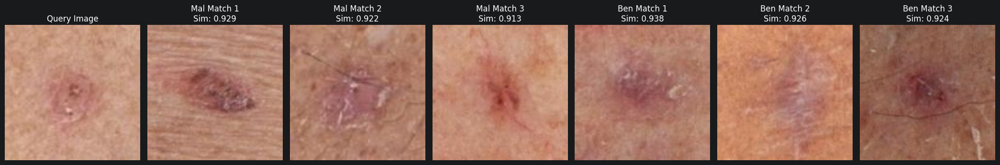

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0119495""","""IP_6856511""",60.0,"""male""","""upper extremity""",5.27,13.26703,0.7450609,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3374114""","""IP_7373371""",60.0,"""female""","""posterior torso""",9.01,30.96266,0.8559193,0.929245
"""ISIC_3093714""","""IP_9301252""",55.0,"""male""","""lower extremity""",8.41,39.36949,0.7022332,0.921976
"""ISIC_8717913""","""IP_2945977""",55.0,"""female""","""anterior torso""",7.48,23.60668,0.801422,0.913265


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_2136522""","""IP_2939024""",65.0,"""male""","""lower extremity""",7.53,26.496528,0.788044,0.938146
"""ISIC_9156440""","""IP_8008363""",50.0,"""female""","""lower extremity""",4.14,6.793019,0.8608205,0.926355
"""ISIC_5090409""","""IP_0658218""",75.0,"""male""","""lower extremity""",6.37,26.064928,0.578639,0.924247


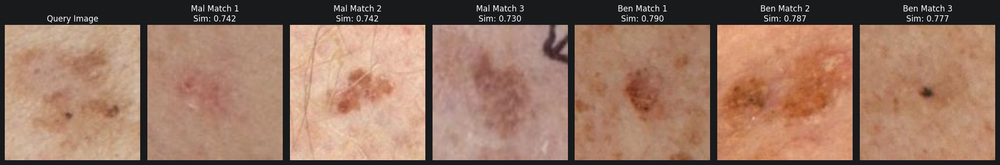

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1063394""","""IP_9324599""",85.0,"""male""","""upper extremity""",13.29,103.0212,0.6741962,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3190920""","""IP_3346083""",45.0,"""female""","""anterior torso""",1.37,1.125915,0.820214,0.742364
"""ISIC_2023222""","""IP_1907604""",55.0,"""male""","""lower extremity""",7.71,22.987427,0.853102,0.742294
"""ISIC_5035525""","""IP_5882439""",70.0,"""female""","""lower extremity""",8.4,36.1231,0.647969,0.729583


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_7304983""","""IP_6547234""",80.0,"""male""","""anterior torso""",5.24,14.5806,0.7546953,0.790192
"""ISIC_4906689""","""IP_5811816""",85.0,"""male""","""anterior torso""",13.73,57.87202,0.8985762,0.786561
"""ISIC_4343073""","""IP_0785416""",60.0,"""male""","""posterior torso""",2.05,2.570839,0.68749,0.77659


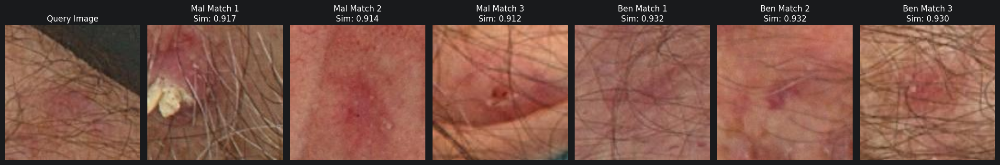

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1164461""","""IP_3371534""",60.0,"""male""","""upper extremity""",1.13,0.769375,0.772838,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_9194166""","""IP_7965642""",60.0,"""male""","""anterior torso""",3.42,4.841434,0.8448045,0.916761
"""ISIC_1141528""","""IP_8614298""",70.0,"""male""","""head/neck""",16.07,69.78795,0.9287367,0.914008
"""ISIC_0704481""","""IP_4215006""",60.0,"""female""","""head/neck""",2.57,3.190092,0.842503,0.911804


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_7076557""","""IP_5907007""",75.0,"""male""","""lower extremity""",7.44,12.25371,0.9129055,0.932116
"""ISIC_7567739""","""IP_1959239""",60.0,"""male""","""upper extremity""",5.33,8.144117,0.872117,0.932026
"""ISIC_3129380""","""IP_5907007""",75.0,"""male""","""upper extremity""",6.62,20.75436,0.7913258,0.930056


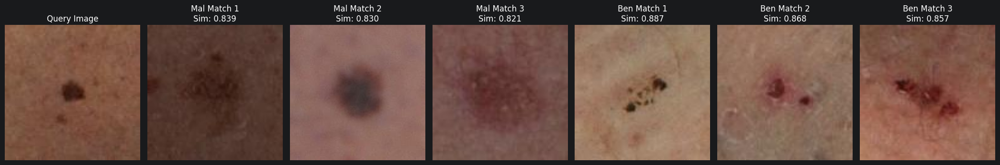

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1623236""","""IP_0023586""",75.0,"""male""","""lower extremity""",2.74,5.760931,0.430875,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_4586629""","""IP_2608498""",60.0,"""female""","""lower extremity""",7.57,35.01595,0.64377,0.83938
"""ISIC_0330452""","""IP_0796643""",55.0,"""male""","""lower extremity""",7.49,32.951773,0.518317,0.829625
"""ISIC_1071408""","""IP_8810058""",60.0,"""male""","""anterior torso""",9.73,58.5288,0.6080366,0.820999


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_5578068""","""IP_1249536""",65.0,"""male""","""lower extremity""",5.93,15.668981,0.856063,0.88713
"""ISIC_5713359""","""IP_8672132""",70.0,"""male""","""lower extremity""",6.67,17.77069,0.8229026,0.868025
"""ISIC_2891550""","""IP_3849715""",35.0,"""male""","""lower extremity""",7.1,24.244699,0.745771,0.85684


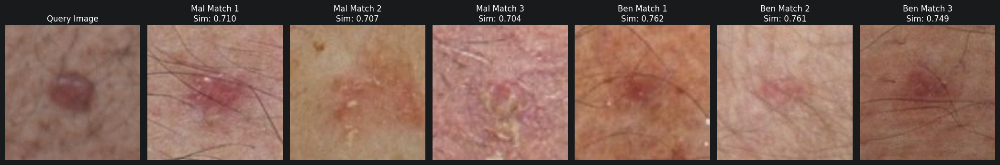

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1721956""","""IP_3921915""",45.0,"""male""","""posterior torso""",6.39,22.687183,0.605732,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_8614100""","""IP_3927284""",55.0,"""male""","""anterior torso""",9.53,36.967536,0.635529,0.710199
"""ISIC_4820306""","""IP_3212820""",85.0,"""male""","""anterior torso""",1.78,1.613811,0.845272,0.707109
"""ISIC_0793445""","""IP_2456971""",60.0,"""male""","""head/neck""",1.92,1.595046,0.885959,0.703786


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_2202347""","""IP_0669361""",70.0,"""male""","""lower extremity""",9.23,28.297992,0.773436,0.761724
"""ISIC_7143969""","""IP_3026867""",65.0,"""male""","""upper extremity""",5.32,7.787577,0.933282,0.76079
"""ISIC_5078229""","""IP_3489821""",60.0,"""male""","""lower extremity""",6.97,22.593357,0.773588,0.748849


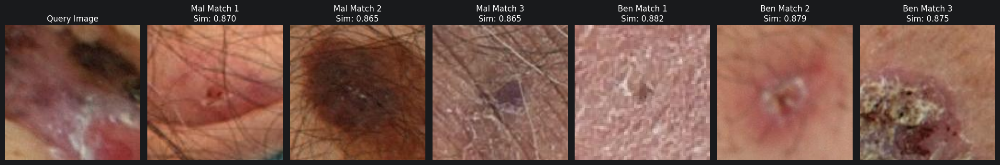

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_2027124""","""IP_6413837""",55.0,"""male""","""posterior torso""",2.4,1.651342,0.9494246,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0704481""","""IP_4215006""",60.0,"""female""","""head/neck""",2.57,3.190092,0.842503,0.870005
"""ISIC_6395169""","""IP_8022574""",50.0,"""male""","""upper extremity""",14.0,77.9133,0.777621,0.865394
"""ISIC_3005303""","""IP_8078890""",80.0,"""male""","""anterior torso""",5.18,14.39294,0.569085,0.865176


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_2767489""","""IP_6723298""",75.0,"""male""","""lower extremity""",3.18,4.522424,0.8430769,0.88151
"""ISIC_7799520""","""IP_7259384""",45.0,"""male""","""upper extremity""",11.27,64.94652,0.7536119,0.879012
"""ISIC_4322900""","""IP_4864692""",70.0,"""male""","""lower extremity""",1.37,1.332333,0.549512,0.875471


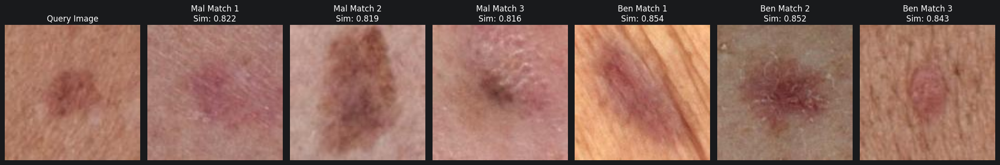

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_2746016""","""IP_8352314""",65.0,"""female""","""lower extremity""",7.01,25.57703,0.7048099,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6294286""","""IP_3927284""",55.0,"""male""","""lower extremity""",6.1,20.92325,0.728634,0.821817
"""ISIC_7231436""","""IP_3232631""",65.0,"""female""","""lower extremity""",12.89,101.482454,0.655013,0.818933
"""ISIC_6507199""","""IP_8977835""",80.0,"""male""","""head/neck""",8.9,30.26834,0.8363595,0.816049


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_5378148""","""IP_8506963""",75.0,"""female""","""lower extremity""",22.71,113.6611,0.9088825,0.853518
"""ISIC_8989396""","""IP_2843614""",85.0,"""male""","""lower extremity""",8.39,49.42766,0.464972,0.852007
"""ISIC_7819855""","""IP_3220951""",60.0,"""male""","""posterior torso""",7.94,25.46444,0.774818,0.84343


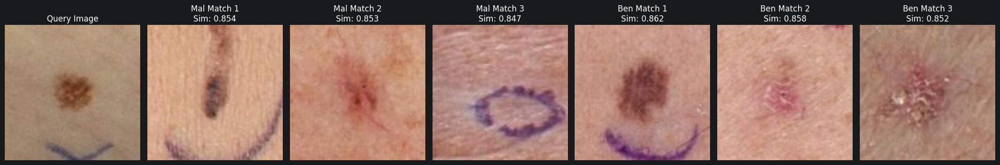

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3377793""","""IP_2506030""",55.0,"""female""","""lower extremity""",4.8,14.787014,0.55214,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_8153765""","""IP_3516318""",50.0,"""male""","""posterior torso""",6.16,13.886283,0.878664,0.85395
"""ISIC_8717913""","""IP_2945977""",55.0,"""female""","""anterior torso""",7.48,23.60668,0.801422,0.85275
"""ISIC_2943219""","""IP_4934005""",60.0,"""male""","""head/neck""",2.01,1.50122,0.920764,0.847139


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_9328902""","""IP_3720977""",55.0,"""male""","""anterior torso""",7.72,34.22781,0.695136,0.862287
"""ISIC_9325482""","""IP_0431324""",70.0,"""male""","""posterior torso""",6.49,16.38206,0.82796,0.858346
"""ISIC_4556564""","""IP_4545121""",80.0,"""male""","""anterior torso""",6.64,18.483768,0.769063,0.85205


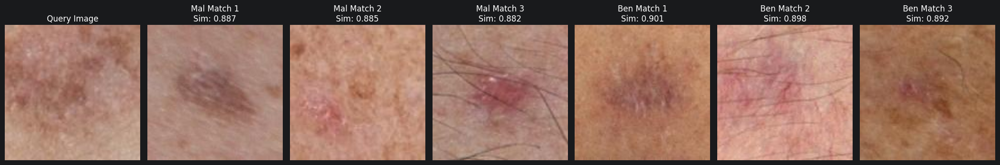

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3398012""","""IP_9324599""",85.0,"""male""","""anterior torso""",2.33,4.165885,0.4858239,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0392749""","""IP_7502403""",50.0,"""female""","""posterior torso""",8.57,38.09345,0.7368104,0.886821
"""ISIC_4954780""","""IP_3619408""",70.0,"""female""","""anterior torso""",1.97,1.595046,0.871481,0.884591
"""ISIC_8614100""","""IP_3927284""",55.0,"""male""","""anterior torso""",9.53,36.967536,0.635529,0.881554


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_9688507""","""IP_0707620""",40.0,"""female""","""lower extremity""",8.75,27.228373,0.825152,0.901285
"""ISIC_4435394""","""IP_1907604""",60.0,"""male""","""lower extremity""",2.73,1.838994,0.956383,0.898347
"""ISIC_2232289""","""IP_1127121""",65.0,"""male""","""unknown""",6.51,17.188966,0.755416,0.892211


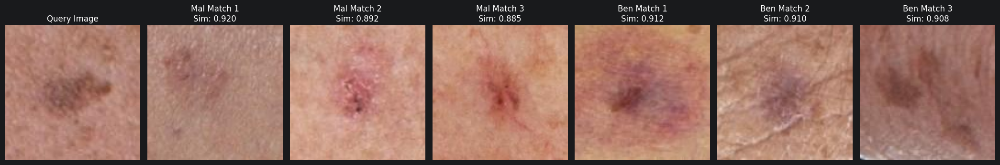

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3467445""","""IP_8683966""",50.0,"""male""","""head/neck""",7.6,25.08913,0.8007054,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_7105211""","""IP_9978624""",55.0,"""female""","""lower extremity""",1.59,1.013323,0.8710382,0.920024
"""ISIC_0157834""","""IP_3927284""",55.0,"""male""","""posterior torso""",5.29,15.049728,0.690814,0.892469
"""ISIC_8717913""","""IP_2945977""",55.0,"""female""","""anterior torso""",7.48,23.60668,0.801422,0.884713


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_4604773""","""IP_0194702""",50.0,"""female""","""anterior torso""",9.03,31.957215,0.699953,0.912101
"""ISIC_9997902""","""IP_8977835""",80.0,"""male""","""upper extremity""",6.79,28.48564,0.3822207,0.91021
"""ISIC_5831783""","""IP_8218877""",60.0,"""female""","""upper extremity""",11.29,59.18559,0.6787257,0.907678


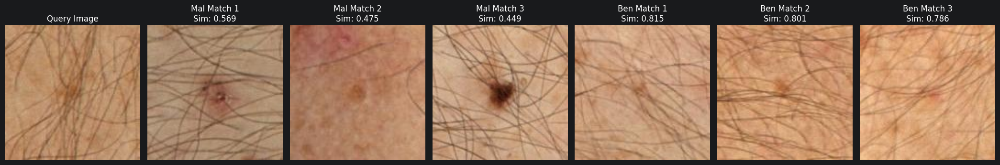

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0051897""","""IP_5516884""",60.0,"""male""","""upper extremity""",4.6,6.192531,0.9049373,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_8269383""","""IP_7293666""",65.0,"""male""","""lower extremity""",3.74,7.825108,0.6673599,0.568767
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.474916
"""ISIC_1662809""","""IP_6611217""",55.0,"""male""","""anterior torso""",4.21,10.54607,0.5072653,0.448729


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6169434""","""IP_1590245""",50.0,"""male""","""posterior torso""",2.95,2.852318,0.889546,0.814647
"""ISIC_5659347""","""IP_3140028""",65.0,"""male""","""anterior torso""",3.6,3.940702,0.851129,0.801257
"""ISIC_5458425""","""IP_0869661""",70.0,"""male""","""upper extremity""",2.6,3.021205,0.859213,0.785804


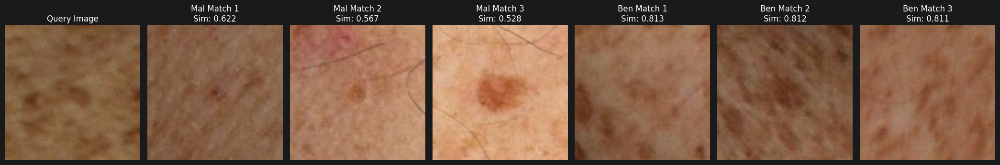

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0051958""","""IP_9726832""",85.0,"""male""","""posterior torso""",3.56,7.036968,0.7339323,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_2604412""","""IP_6423094""",70.0,"""female""","""posterior torso""",1.3,1.088384,0.7118513,0.622209
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.567008
"""ISIC_0275647""","""IP_7411721""",45.0,"""male""","""posterior torso""",5.62,18.87784,0.6477496,0.527917


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3307476""","""IP_5539318""",70.0,"""female""","""posterior torso""",3.84,6.417714,0.850239,0.813276
"""ISIC_1905707""","""IP_1117889""",55.0,"""female""","""anterior torso""",4.36,12.535185,0.600004,0.81216
"""ISIC_2685253""","""IP_9577633""",50.0,"""male""","""posterior torso""",3.1,3.265153,0.8887371,0.811057


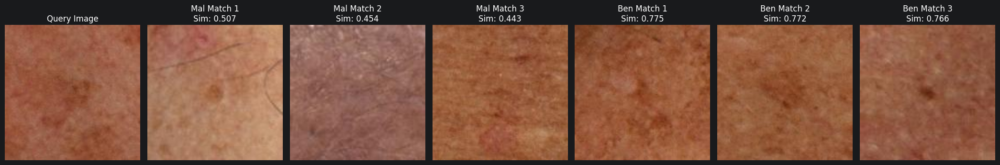

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0052094""","""IP_9179679""",70.0,"""male""","""head/neck""",3.95,7.918934,0.471671,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.507292
"""ISIC_1105887""","""IP_0277335""",55.0,"""male""","""lower extremity""",1.1,0.675549,0.832067,0.45435
"""ISIC_8832909""","""IP_7792811""",55.0,"""female""","""posterior torso""",1.23,1.069619,0.6069849,0.44328


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6714828""","""IP_1299153""",55.0,"""male""","""posterior torso""",3.3,4.090824,0.816462,0.774665
"""ISIC_5284435""","""IP_6356898""",60.0,"""male""","""posterior torso""",4.63,10.47101,0.7566215,0.771614
"""ISIC_1728663""","""IP_3858404""",65.0,"""male""","""anterior torso""",2.05,2.326891,0.752688,0.765995


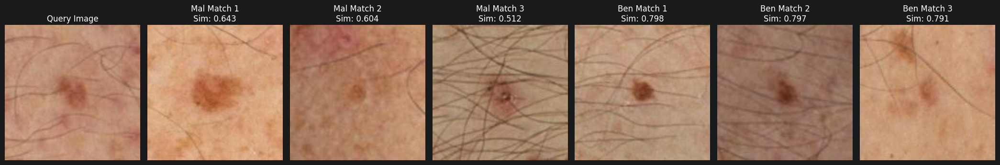

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0073511""","""IP_3371534""",60.0,"""male""","""lower extremity""",4.17,8.969788,0.762354,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0275647""","""IP_7411721""",45.0,"""male""","""posterior torso""",5.62,18.87784,0.6477496,0.642597
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.604361
"""ISIC_8269383""","""IP_7293666""",65.0,"""male""","""lower extremity""",3.74,7.825108,0.6673599,0.511881


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_7461361""","""IP_0785416""",60.0,"""male""","""lower extremity""",3.06,5.817226,0.569985,0.79762
"""ISIC_9260061""","""IP_2702014""",80.0,"""male""","""lower extremity""",3.99,7.918934,0.769609,0.797364
"""ISIC_6108374""","""IP_6611217""",55.0,"""male""","""anterior torso""",2.74,3.415275,0.8406142,0.791022


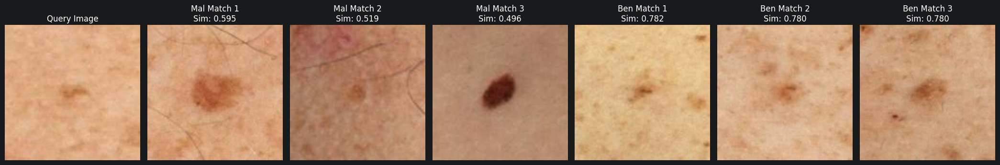

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0073555""","""IP_3371534""",60.0,"""male""","""posterior torso""",2.76,3.490336,0.839144,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0275647""","""IP_7411721""",45.0,"""male""","""posterior torso""",5.62,18.87784,0.6477496,0.595144
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.519224
"""ISIC_6561814""","""IP_9248436""",45.0,"""female""","""anterior torso""",5.11,12.19741,0.8014283,0.496013


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_8142037""","""IP_7148655""",40.0,"""male""","""posterior torso""",3.3,4.072059,0.8633347,0.781734
"""ISIC_0337766""","""IP_1016097""",45.0,"""male""","""posterior torso""",3.01,5.179208,0.660221,0.779917
"""ISIC_5292201""","""IP_8781267""",50.0,"""male""","""posterior torso""",4.09,9.176206,0.7532834,0.779647


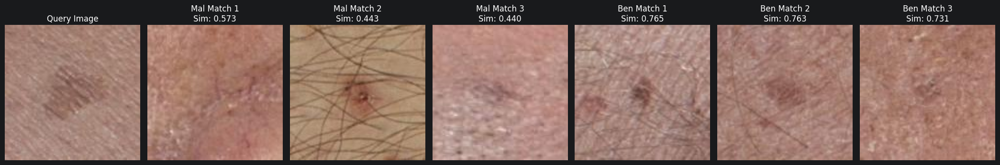

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0073777""","""IP_4905048""",45.0,"""female""","""lower extremity""",6.34,23.531619,0.475515,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6608075""","""IP_3823237""",65.0,"""female""","""head/neck""",3.08,2.308125,0.935853,0.573444
"""ISIC_8269383""","""IP_7293666""",65.0,"""male""","""lower extremity""",3.74,7.825108,0.6673599,0.442687
"""ISIC_5985180""","""IP_9801595""",60.0,"""male""","""head/neck""",2.7,4.109589,0.5925312,0.439863


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_2810720""","""IP_7695606""",50.0,"""male""","""lower extremity""",3.19,5.798461,0.7467758,0.765396
"""ISIC_5276827""","""IP_3785831""",70.0,"""male""","""lower extremity""",3.84,9.926816,0.628124,0.762631
"""ISIC_4786099""","""IP_7312348""",75.0,"""male""","""head/neck""",2.87,4.259711,0.7168473,0.730759


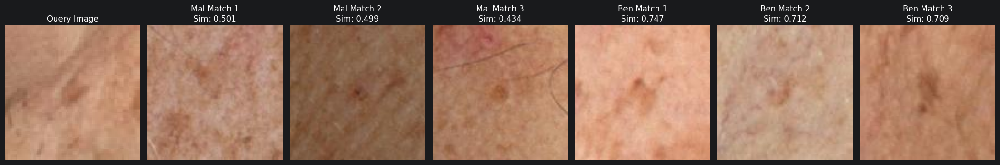

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0073877""","""IP_3921915""",50.0,"""male""","""upper extremity""",4.11,4.710077,0.938472,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3201295""","""IP_7473498""",65.0,"""male""","""anterior torso""",1.1,0.9194971,0.6940682,0.500928
"""ISIC_2604412""","""IP_6423094""",70.0,"""female""","""posterior torso""",1.3,1.088384,0.7118513,0.498623
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.434448


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_8538137""","""IP_5539318""",70.0,"""female""","""upper extremity""",3.19,5.911053,0.7029898,0.746882
"""ISIC_3349046""","""IP_5980491""",70.0,"""female""","""lower extremity""",2.6,2.533308,0.8962784,0.711973
"""ISIC_4725913""","""IP_1127121""",65.0,"""male""","""unknown""",4.51,8.33177,0.828698,0.709407


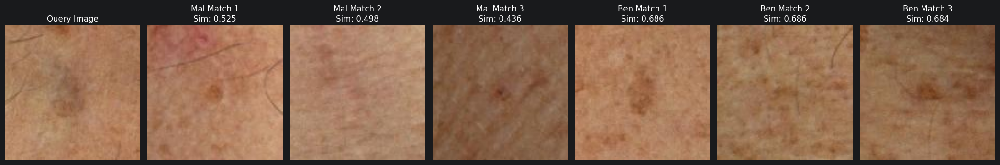

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0073944""","""IP_6863831""",60.0,"""male""","""lower extremity""",4.84,8.275474,0.8786305,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.524878
"""ISIC_2346081""","""IP_3140028""",65.0,"""male""","""posterior torso""",1.4,1.482454,0.486344,0.498011
"""ISIC_2604412""","""IP_6423094""",70.0,"""female""","""posterior torso""",1.3,1.088384,0.7118513,0.43623


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3311528""","""IP_8457418""",65.0,"""female""","""lower extremity""",5.48,10.37718,0.8689566,0.686269
"""ISIC_4333560""","""IP_0251074""",55.0,"""male""","""posterior torso""",2.7,2.68343,0.920471,0.685547
"""ISIC_1415726""","""IP_5143034""",80.0,"""male""","""posterior torso""",3.15,5.066617,0.748973,0.684243


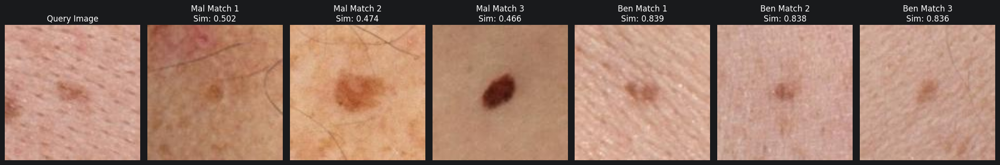

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0074460""","""IP_7152379""",55.0,"""male""","""posterior torso""",3.83,6.323888,0.8581613,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.502375
"""ISIC_0275647""","""IP_7411721""",45.0,"""male""","""posterior torso""",5.62,18.87784,0.6477496,0.473829
"""ISIC_6561814""","""IP_9248436""",45.0,"""female""","""anterior torso""",5.11,12.19741,0.8014283,0.465684


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_9856682""","""IP_5989034""",45.0,"""male""","""posterior torso""",4.05,6.192531,0.8877578,0.839175
"""ISIC_4782230""","""IP_2426108""",50.0,"""female""","""upper extremity""",2.51,4.203415,0.615618,0.837731
"""ISIC_8019872""","""IP_1235828""",60.0,"""male""","""anterior torso""",2.75,4.447363,0.75513,0.835831


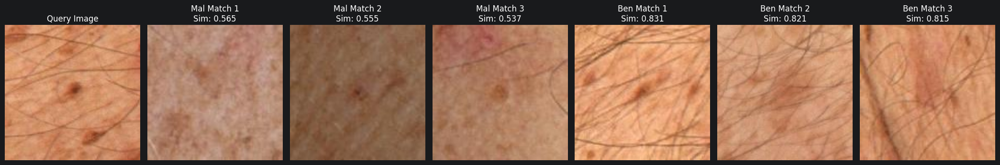

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0074664""","""IP_9179679""",70.0,"""male""","""posterior torso""",3.01,4.034528,0.8523205,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3201295""","""IP_7473498""",65.0,"""male""","""anterior torso""",1.1,0.9194971,0.6940682,0.564641
"""ISIC_2604412""","""IP_6423094""",70.0,"""female""","""posterior torso""",1.3,1.088384,0.7118513,0.555325
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.537078


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_4328176""","""IP_0869661""",70.0,"""male""","""posterior torso""",2.7,2.946144,0.876616,0.831324
"""ISIC_3796242""","""IP_3631110""",45.0,"""male""","""posterior torso""",6.61,17.48921,0.778133,0.820675
"""ISIC_7476647""","""IP_0869661""",70.0,"""male""","""posterior torso""",3.1,5.911053,0.593042,0.815334


In [14]:
full_model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
full_model.fc = nn.Sequential(nn.Dropout(0.3), nn.Linear(full_model.fc.in_features, 1))
full_model.load_state_dict(torch.load(model_path / "best_image_model.pt", weights_only=True))
full_model = full_model.to(device)
full_model.eval()

val_mal_indices = [i for i, m in enumerate(val_malignant) if m == 1][:10]
val_ben_indices = [i for i, m in enumerate(val_malignant) if m == 0][:10]
query_indices = val_mal_indices + val_ben_indices

display_cols = [
    "isic_id", "patient_id", "age_approx", "sex", "anatom_site_general",
    "clin_size_long_diam_mm", "tbp_lv_areaMM2", "tbp_lv_eccentricity"
]


def get_ordered_raw_table(isic_ids, sims):
    ordered_df = pl.DataFrame({"isic_id": isic_ids, "similarity": sims})
    raw_features = df.select(display_cols)
    result = ordered_df.join(raw_features, on="isic_id", how="left", maintain_order="left")

    result = result.with_columns(
        pl.col("age_approx").fill_null(median_age),
        pl.col("sex").fill_null(mode_sex),
        pl.col("anatom_site_general").fill_null("unknown")
    )

    cols = [c for c in result.columns if c != "similarity"] + ["similarity"]
    return result.select(cols)


for q_idx in query_indices:
    query_emb = val_embeddings[q_idx].reshape(1, -1)

    D_mal, I_mal = index_mal.search(query_emb, 3)
    D_ben, I_ben = index_ben.search(query_emb, 3)

    q_row = val_df.row(q_idx, named=True)
    gt_class = "Malignant" if q_row["malignant"] == 1 else "Benign"

    img = Image.open(q_row['image_path']).convert("RGB")
    img_tensor = val_transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        logit = full_model(img_tensor)
        prob = torch.sigmoid(logit).item()

    display(HTML(f"<h3>Query: {q_row['isic_id']} | Ground Truth: {gt_class} | Predicted Probability: {prob:.4f}</h3>"))

    fig, axes = plt.subplots(1, 7, figsize=(21, 4))

    axes[0].imshow(img)
    axes[0].set_title("Query Image")
    axes[0].axis('off')

    for i in range(3):
        m_row = mal_train_df.row(I_mal[0][i], named=True)
        axes[i + 1].imshow(Image.open(m_row['image_path']))
        axes[i + 1].set_title(f"Mal Match {i + 1}\nSim: {D_mal[0][i]:.3f}")
        axes[i + 1].axis('off')

    for i in range(3):
        b_row = ben_train_df.row(I_ben[0][i], named=True)
        axes[i + 4].imshow(Image.open(b_row['image_path']))
        axes[i + 4].set_title(f"Ben Match {i + 1}\nSim: {D_ben[0][i]:.3f}")
        axes[i + 4].axis('off')

    plt.tight_layout()
    plt.show()

    q_table = get_ordered_raw_table([q_row['isic_id']], [1.0])
    display(HTML("<b>Query Tabular Data:</b>"))
    display(q_table)

    mal_ids = I_mal[0].tolist()
    mal_sims = D_mal[0].tolist()
    mal_isic_ids = mal_train_df.gather(mal_ids)["isic_id"].to_list()
    mal_table = get_ordered_raw_table(mal_isic_ids, mal_sims)
    display(HTML("<b>Top 3 Malignant Matches:</b>"))
    display(mal_table)

    ben_ids = I_ben[0].tolist()
    ben_sims = D_ben[0].tolist()
    ben_isic_ids = ben_train_df.gather(ben_ids)["isic_id"].to_list()
    ben_table = get_ordered_raw_table(ben_isic_ids, ben_sims)
    display(HTML("<b>Top 3 Benign Matches:</b>"))
    display(ben_table)

    display(HTML("<hr>"))